In [1]:
# Windows: first, install Visual Studio build tools
# pip install nes-py
# pip install gym-super-mario-bros

from nes_py.wrappers import JoypadSpace
import gym_super_mario_bros
from gym_super_mario_bros.actions import COMPLEX_MOVEMENT

In [2]:
from LegoRL import *

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import numpy as np
import gym

# Environment

In [4]:
# SOURCE: https://github.com/uvipen/Super-mario-bros-A3C-pytorch/blob/master/src/env.py
from gym.spaces import Box
from gym import Wrapper
import cv2
import numpy as np
from collections import defaultdict

class CustomReward(Wrapper):
    def __init__(self, env):
        super(CustomReward, self).__init__(env)
        self.observation_space = Box(low=0, high=1, shape=(3, 84, 84))
        self.curr_score = 0
    
    def process_frame(self, frame):
        #frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
        frame = cv2.resize(frame, (84, 84)) / 255.
        #frame = np.swapaxes(frame, -1, 0)
        return frame.T
    
    def step(self, action):
        state, reward, done, info = self.env.step(action)        
        state = self.process_frame(state)
        
        # информация
        self.was_tall = self.was_tall or info["status"] == "tall"
        self.was_fireball = self.was_fireball or info["status"] == "fireball"        
        info["was_tall"] = self.was_tall
        info["was_fireball"] = self.was_fireball
        
        key = info["world"], info["stage"]
        self.max_x_pos[key] = max(self.max_x_pos[key], info["x_pos"])
        info["max_x_pos"] = sum(self.max_x_pos.values())
        info["passed_levels"] = len(self.max_x_pos.keys())
        
        # награда
        reward = max(reward, 0)
        reward += info["score"] - self.curr_score
        self.curr_score = info["score"]
        
        if info["life"] < self.lives or (done and not info["flag_get"]):
            reward -= 2000
        self.lives = info["life"]
                
        return state, reward / 100, done, info

    def reset(self):
        self.curr_score = 0
        self.was_tall = 0
        self.was_fireball = 0
        self.max_x_pos = defaultdict(int)
        self.lives = 2
        return self.process_frame(self.env.reset())


class CustomSkipFrame(Wrapper):
    def __init__(self, env, skip=4):
        super(CustomSkipFrame, self).__init__(env)
        self.observation_space = Box(low=0, high=1, shape=(12, 84, 84))
        self.skip = skip

    def step(self, action):
        total_reward = 0
        states = []
        done = False
        for i in range(self.skip):
            if not done:
                state, reward, done, info = self.env.step(action)
                total_reward += reward
                states.append(state)
            else:
                states.append(state)
        states = np.concatenate(states, 0)[:, :, :]
        return states.astype(np.float32), total_reward, done, info

    def reset(self):
        state = self.env.reset()
        states = np.concatenate([state for _ in range(self.skip)], 0)[:, :, :]
        return states.astype(np.float32)

In [5]:
def create_env():
    def _thunk():
        env = gym_super_mario_bros.make('SuperMarioBros-v0')
        env = JoypadSpace(env, COMPLEX_MOVEMENT)             # we want 12 actions instead of 2^12
        env = CustomReward(env)
        env = CustomSkipFrame(env)
        return env
    return _thunk

In [6]:
env = create_env()()
print("Observation space:", env.observation_space)
print("Action space:", env.action_space)

Observation space: Box(12, 84, 84)
Action space: Discrete(12)


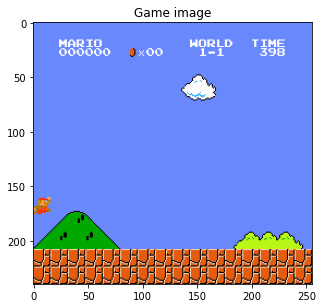

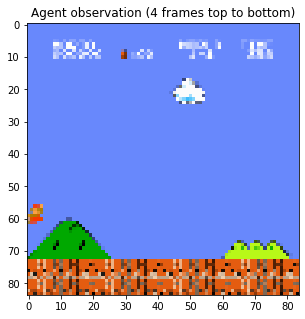

In [7]:
env.reset()
for _ in range(12):
    obs, _, _, info = env.step(env.action_space.sample())

plt.figure(figsize=[5,5])
plt.title("Game image")
plt.imshow(env.render("rgb_array"))
plt.show()

plt.figure(figsize=[5,5])
plt.title("Agent observation (4 frames top to bottom)")
plt.imshow(obs[-3:].T)
plt.show()

In [8]:
info

{'coins': 0,
 'flag_get': False,
 'life': 2,
 'score': 0,
 'stage': 1,
 'status': 'small',
 'time': 398,
 'world': 1,
 'x_pos': 1,
 'y_pos': 112,
 'was_tall': False,
 'was_fireball': False,
 'max_x_pos': 40,
 'passed_levels': 1}

In [9]:
LOG_INFO = [("was_tall", "was_tall"), ("was_fireball", "was_fireball"), ("max_x_pos", "max_x_pos"), ("coins", "coins"), ("passed_levels", "passed_levels")]

# Network

In [10]:
class Flatten(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, x):
        return x.view(*x.shape[:-3], -1)

class MarioNN(nn.Module):
    def __init__(self, input_size, output_size):
        super().__init__()
        
        self.layers = nn.Sequential(
            nn.Conv2d(12, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),           
            nn.Conv2d(32, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            Flatten(),
            nn.Linear(1152, output_size),
            nn.ReLU()
        )
        
    def forward(self, x):
        names = x.names
        x = x.rename(None)
        return self.layers(x).refine_names(*names[:-3], "features")

# Proximal Policy Optimization

In [11]:
class PPO(System):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
        self.runner            = Runner(self, threads=8, env_max_T=2004, log_info=LOG_INFO)
        self.rollout_collector = RolloutCollector(self, rollout_length=128)
        self.epoched_sampler   = EpochedRollout(self, epochs=3, batch_size=64)
        
        self.backbone     = Model(self, MarioNN, output=Embedding(256))
        self.policy       = PolicyNetwork(self, input=Embedding(256))
        self.critic       = VNetwork(self, input=Embedding(256))
        
        self.gae          = GAE(self, tau=0.95)
        self.center_adv   = AdvantageNormalizer(self)
        
        self.actor_loss   = ProximalLoss(self)
        self.critic_loss  = ProximalCriticLoss(self, weight=0.5)
        self.entropy_loss = EntropyLoss(self, weight=0.1)
        self.trainer      = Trainer(self, models=[self.backbone, self.policy, self.critic], 
                                    optimizer_args={"lr": 0.0001, "eps": 1e-5}, clip_gradients=10)
        
    def act(self, states, *args, **kwargs):
        # forward pass through network
        with torch.no_grad():
            embedding = self.backbone(states)
            policy = self.policy(embedding)
            V = self.critic(embedding)
            actions = policy.sample()
            return Storage(actions=actions, policy=policy, V=V)        
        
    def iteration(self):
        batch = self.epoched_sampler.sample_next()
        
        if batch is None:
            # collecting data stage
            with torch.no_grad():
                # forward pass through network
                embedding = self.backbone(self.runner.states)
                policy = self.policy(embedding)
                V = self.critic(embedding)
                actions = policy.sample()
                
                # collect rollout of transitions
                transition = self.runner.step(actions)        
                transition.update(V=V, policy=policy)            
                rollout = self.rollout_collector.add(transition)
                
                # if got enough transitions
                if rollout:
                    # compute GAE advantages
                    last_embedding = self.backbone(self.runner.states)
                    last_V = self.critic(last_embedding)
                    adv = self.gae(rollout.rewards, rollout.V, rollout.discounts, last_V)
                    
                    # store collected dataset
                    self.epoched_sampler.new_dataset(Storage(states=rollout.states, 
                                                             actions=rollout.actions, 
                                                             old_policy=rollout.policy, 
                                                             old_V = rollout.V, 
                                                             adv = adv))
        else:
            # training stage            
            embedding = self.backbone(batch.states)
            policy = self.policy(embedding)
            V = self.critic(embedding)
            
            # target for critic is GAE advantage + old V(s)
            target_V = batch.adv.add_v(batch.old_V)
            center_adv = self.center_adv(batch.adv)
            
            # optimize
            loss1 = self.actor_loss(policy, batch.old_policy, batch.actions, center_adv)
            loss2 = self.critic_loss(V, batch.old_V, target_V)
            loss3 = self.entropy_loss(policy)
            
            self.trainer.optimize(loss1 + loss2 + loss3)

In [12]:
ppo        = PPO(gamma=0.98, folder_name="models/Mario PPO", save_timer=25000, make_env=create_env)
player     = Player(ppo, policy=ppo.act, timer=25000, record_timer=25000)
visualizer = Visualizer(ppo, timer=5000)

Runner: environment initialization... Finished.
Initializing <Model>:
  Input shape is torch.Size([12, 84, 84])
  Output shape is torch.Size([256])
Initializing <PolicyNetwork>:
  Input shape is torch.Size([256])
  Output shape is torch.Size([12])
Initializing <VNetwork>:
  Input shape is torch.Size([256])
  Output shape is torch.Size([])


In [13]:
ppo

<Runner>: Makes steps in 8 parallel environments
<RolloutCollector>: Collects rollouts of length 128
<EpochedRollout>: Performs 3 epoches with batches of size 64 on provided dataset
<Model>: Models Embedding of size 256
<PolicyNetwork>: Models Discrete Policy
<VNetwork>: Models V-function
<GAE>: Estimates GAE advantages
<AdvantageNormalizer>: Normalizes advantages in the batch to zero mean and unit std
<ProximalLoss>: Calculates PPO gradient estimation
<ProximalCriticLoss>: Calculates proximal TD loss by clipping prediction when it is far from old prediction
<EntropyLoss>: Calculates entropy penalty
<Trainer>: Standard SGD loss optimization
<Player>: Plays full game each 25000 iteration
<Visualizer>: Plots logs every 5000 iteration

In [14]:
ppo.hyperparameters()

{'Runner': {'num_envs': 8},
 'RolloutCollector': {'rollout_length': 128},
 'EpochedRollout': {'epochs': 3, 'batch_size': 64},
 'GAE': {'GAE tau': 0.95},
 'ProximalLoss': {'ppo_clip': 0.2},
 'ProximalCriticLoss': {'cliprange': 0.2},
 'EntropyLoss': {'weight': 0.1},
 'Trainer': {'clip_gradients': 10,
  'optimizer': 'Adam',
  'optimizer lr': 0.0001,
  'optimizer eps': 1e-05},
 'gamma': 0.98}

In [15]:
ppo.load()

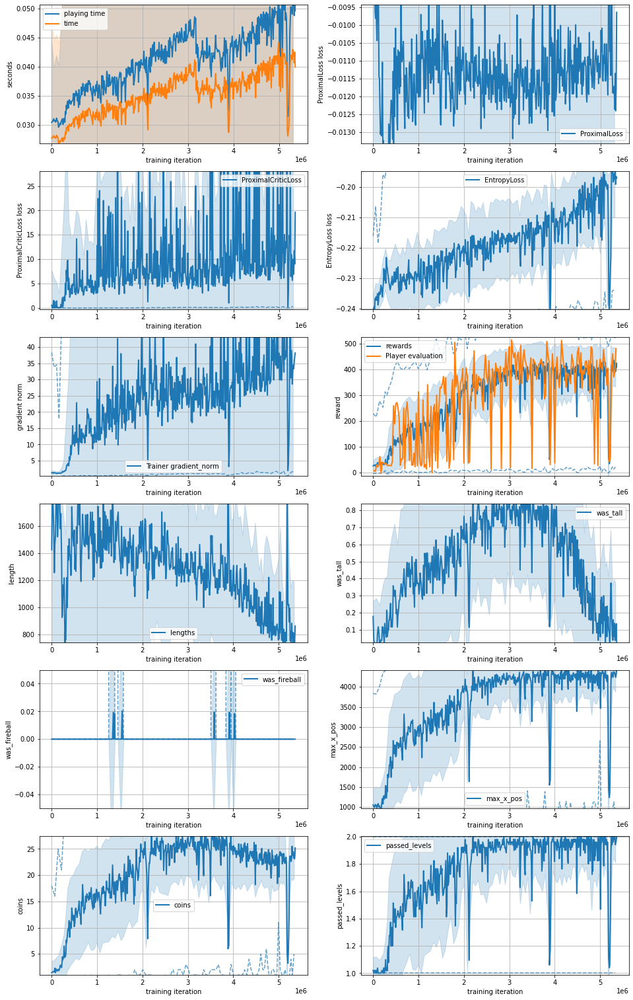

KeyboardInterrupt: 

In [16]:
ppo.run(10000000)

# What we learned

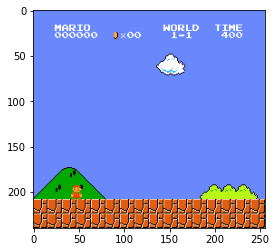

In [17]:
rollout = ppo.runner.play(policy=ppo.act, render=True, store_frames=True, time_limit=2000)

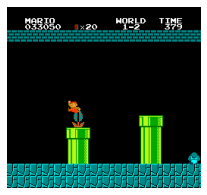

In [20]:
# shows animation of recorded game
show_animation(rollout.frames)

(0.0, 10.0)

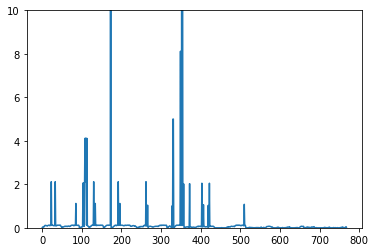

In [19]:
# reward plot
plt.plot(rollout.rewards.numpy[:, 0])
plt.ylim(0, 10)

In [29]:
rollout.rewards.numpy[:, 0]

array([ 0.000e+00,  3.000e-02,  4.000e-02,  5.000e-02,  3.000e-02,
        7.000e-02,  8.000e-02,  1.100e-01,  1.100e-01,  1.100e-01,
        1.000e-01,  1.000e-01,  9.000e-02,  8.000e-02,  1.000e-01,
        1.100e-01,  1.200e-01,  1.100e-01,  1.200e-01,  1.000e-01,
        1.000e-01,  1.200e-01,  1.200e-01,  2.120e+00,  1.100e-01,
        1.200e-01,  1.200e-01,  1.100e-01,  1.100e-01,  1.000e-01,
        9.000e-02,  1.000e-01,  1.200e-01,  2.120e+00,  9.000e-02,
        9.000e-02,  9.000e-02,  1.100e-01,  1.200e-01,  1.100e-01,
        1.200e-01,  1.200e-01,  1.200e-01,  1.200e-01,  1.100e-01,
        1.200e-01,  1.200e-01,  8.000e-02,  6.000e-02,  3.000e-02,
        1.000e-02,  4.000e-02,  4.000e-02,  3.000e-02,  4.000e-02,
        5.000e-02,  6.000e-02,  7.000e-02,  7.000e-02,  6.000e-02,
        7.000e-02,  7.000e-02,  6.000e-02,  7.000e-02,  6.000e-02,
        7.000e-02,  8.000e-02,  8.000e-02,  7.000e-02,  6.000e-02,
        7.000e-02,  7.000e-02,  9.000e-02,  1.100e-01,  1.100e

# Training statistics

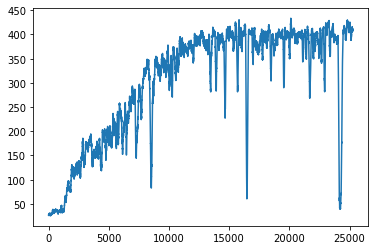

In [22]:
from LegoRL.utils.visualizer import smoothen
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(smoothen(ppo.logger["rewards"], 100))

In [26]:
print("Learning time in hours: ", ppo.wallclock() / 60 / 60)
print("Viz. time in hours: ", ppo.viz_wallclock() / 60 / 60)
print("Frames done: ", ppo.runner.frames_done)
print("Fps: ", ppo.runner.fps)
print("Episodes played: ", ppo.runner.episodes_done)

Learning time in hours:  52.38117278403706
Viz. time in hours:  3.270657837986946
Frames done:  1991680
Fps:  10.561894952704138
Episodes played:  2325
